## Visualizacion
Usaremos en esta clase, el paquete `Gadfly` (http://gadflyjl.org/stable/index.html)


In [1]:
using Gadfly
using DataFrames
using CSV
using RDatasets
using GLM
using Distributions

Un ejemplo clásico de que la visualización es importante: _anscombe_

In [2]:
anscombe = dataset("datasets", "anscombe")

,X1,X2,X3,X4,Y1,Y2,Y3,Y4
1,10,10,10,8,8.04,9.14,7.46,6.58
2,8,8,8,8,6.95,8.14,6.77,5.76
3,13,13,13,8,7.58,8.74,12.74,7.71
4,9,9,9,8,8.81,8.77,7.11,8.84
5,11,11,11,8,8.33,9.26,7.81,8.47
6,14,14,14,8,9.96,8.1,8.84,7.04
7,6,6,6,8,7.24,6.13,6.08,5.25
8,4,4,4,19,4.26,3.1,5.39,12.5
9,12,12,12,8,10.84,9.13,8.15,5.56
10,7,7,7,8,4.82,7.26,6.42,7.91


Veamos unas estadísticas básicas:

In [3]:
colwise(mean, anscombe)

8-element Array{Float64,1}:
 9.0    
 9.0    
 9.0    
 9.0    
 7.50091
 7.50091
 7.5    
 7.50091

In [4]:
colwise(std, anscombe)

8-element Array{Float64,1}:
 3.31662
 3.31662
 3.31662
 3.31662
 2.03157
 2.03166
 2.03042
 2.03058

In [5]:
for i in 1:4
    println("Correlacion X$i vs Y$i es " * string(cor(anscombe[:,i],anscombe[:,i+4])))
end

Correlacion X1 vs Y1 es 0.8164205163448398
Correlacion X2 vs Y2 es 0.8162365060002429
Correlacion X3 vs Y3 es 0.8162867394895982
Correlacion X4 vs Y4 es 0.8165214368885028


In [6]:
for i in 1:4
    println("Regresion lineal entre X$i vs Y$i con coeficientes: " * string(linreg(anscombe[:,i],anscombe[:,i+4])))
end

Regresion lineal entre X1 vs Y1 con coeficientes: (3.0000909090909103, 0.5000909090909091)
Regresion lineal entre X2 vs Y2 con coeficientes: (3.000909090909091, 0.5)
Regresion lineal entre X3 vs Y3 con coeficientes: (3.0024545454545466, 0.49972727272727274)
Regresion lineal entre X4 vs Y4 con coeficientes: (3.0017272727272726, 0.49990909090909086)


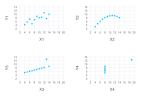

In [7]:
p1 = plot(anscombe, x=:X1, y=:Y1, Geom.point, Coord.cartesian(xmin=2, xmax=20, ymin=2, ymax=14));
p2 = plot(anscombe, x=:X2, y=:Y2, Coord.cartesian(xmin=2, xmax=20, ymin=2, ymax=14));
p3 = plot(anscombe, x=:X3, y=:Y3, Coord.cartesian(xmin=2, xmax=20, ymin=2, ymax=14));
p4 = plot(anscombe, x=:X4, y=:Y4, Coord.cartesian(xmin=2, xmax=20, ymin=2, ymax=14));
gridstack([p1 p2 ; p3 p4])

# The Grammar of Graphics



El comando `plot` permite hacer usar la gramática de gráficos, para visualizar datos. El formato es:
```
   plot (<DataFrame>, <aesthetics> (x, y, color), Geom.<geometria>)
```

In [8]:
describe(anscombe)

,variable,mean,min,median,max,nunique,nmissing,eltype
1,X1,9.0,4,9.0,14,,0,Int64
2,X2,9.0,4,9.0,14,,0,Int64
3,X3,9.0,4,9.0,14,,0,Int64
4,X4,9.0,8,8.0,19,,0,Int64
5,Y1,7.50091,4.26,7.58,10.84,,0,Float64
6,Y2,7.50091,3.1,8.14,9.26,,0,Float64
7,Y3,7.5,5.39,7.11,12.74,,0,Float64
8,Y4,7.50091,5.25,7.04,12.5,,0,Float64


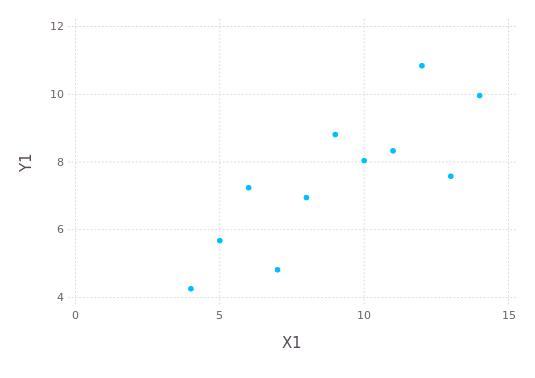

In [13]:
plot(anscombe, x=:X1, y=:Y1, Geom.point)  #o Geom.line, Geom.bar, o varios!

Lo anterior se llama un *scatterplot*. Podemos formatear el grafico dentro de sus atributos, dentro del `Theme`.

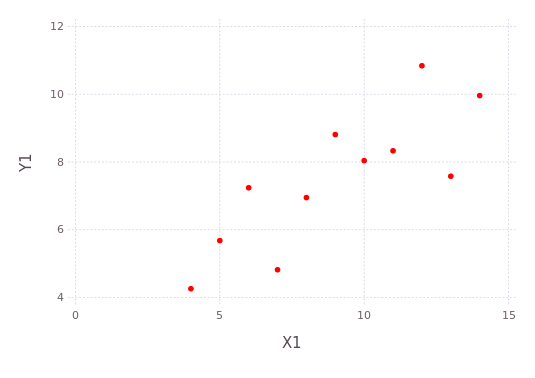

In [14]:
plot(anscombe, x=:X1, y=:Y1, Geom.point, Theme(default_color="red"))

o agregar elementos (guías) al grafico en `Guide`, como un titulo, o etiquetas.

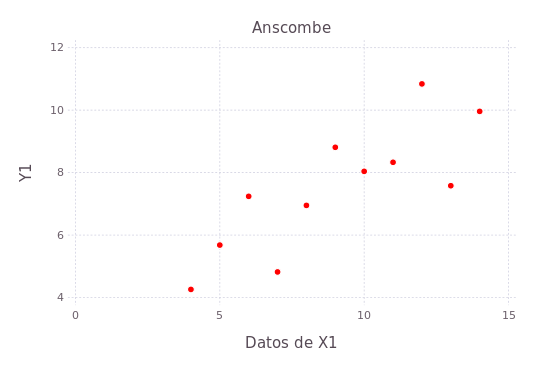

In [15]:
plot(anscombe, x=:X1, y=:Y1, Geom.point, Theme(default_color="red"), Guide.xlabel("Datos de X1"), Guide.title("Anscombe"))

Tambien podemos exportarlo a un archivo con el comando `draw`.  

In [18]:
p=plot(anscombe, x=:X1, y=:Y1, Geom.point, Theme(default_color="red"), Guide.xlabel("Datos de X1"), Guide.title("Anscombe"))
draw(PDF("archivo.pdf", 10cm, 10cm),p)

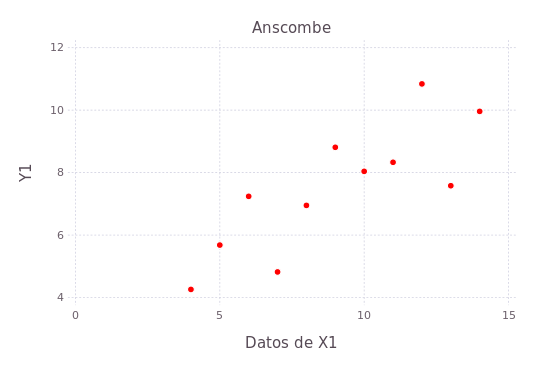

In [17]:
p

Usemos ahora otra base de datos:

In [20]:
iris = dataset("datasets", "iris")
describe(iris)

,variable,mean,min,median,max,nunique,nmissing,eltype
1,SepalLength,5.84333,4.3,5.8,7.9,,,Float64
2,SepalWidth,3.05733,2.0,3.0,4.4,,,Float64
3,PetalLength,3.758,1.0,4.35,6.9,,,Float64
4,PetalWidth,1.19933,0.1,1.3,2.5,,,Float64
5,Species,,,,,3,,CategoricalArrays.CategoricalString{UInt8}


## Ejercicio 1:
Dibuje un scatterplot de *SepalLength* vs *PetalLength*

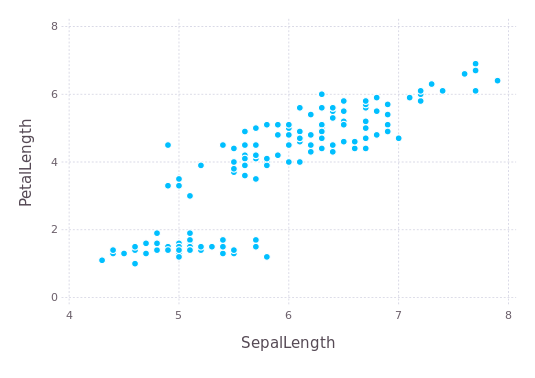

In [21]:
plot(iris,x=:SepalLength, y=:PetalLength, Geom.point)

Agreguemos aesthetics: Por ejemplo, podemos agregar la información de la especie, como un color:

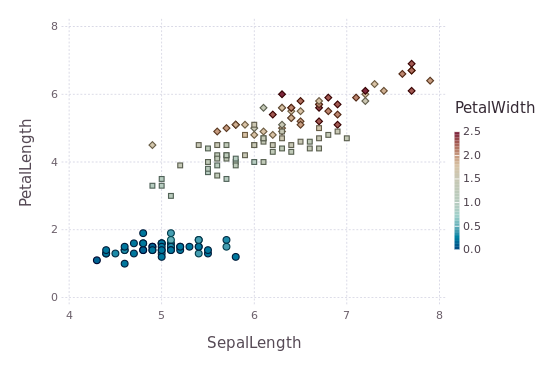

In [24]:
plot(iris,x=:SepalLength, y=:PetalLength, color=:PetalWidth, shape=:Species, Geom.point)

## Ejercicio 2: 
cambiar el tamaño del dato de acuerdo a *petal_width*

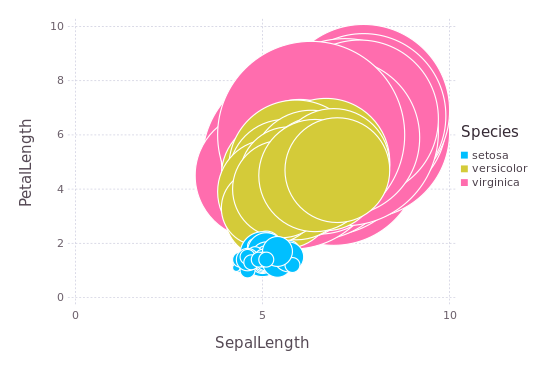

In [26]:
plot(iris,x=:SepalLength, y=:PetalLength, size=:PetalWidth, color=:Species, Geom.point)

Volvamos a los datos de Hubway.  Carguemoslos, grafiquemoslo en el plano (como si fueran puntos).

In [27]:
stations = CSV.read("../02-Peleando-Datos/stations.csv");
dataTrips = CSV.read("../02-Peleando-Datos/trips_new.csv",rows_for_type_detect=100000);
dataTrips = dataTrips[!ismissing.(dataTrips[:start_station]) & !ismissing.(dataTrips[:end_station]),:];
dataTrips[:duration] = map(x -> x/60, dataTrips[:duration]);
dataTrips = dataTrips[dataTrips[:duration] .< 4*60,:]

,id,duration,start_date,start_station,end_date,end_station,bike_nr,subscription_type,zip_code,birth_date,gender
1,8,0.15,2011-07-28T10:12:00.04,23,2011-07-28T10:12:00.04,23,B00468,Registered,97217,1976,Male
2,9,3.66667,2011-07-28T10:21:00.04,23,2011-07-28T10:25:00.04,23,B00554,Registered,02215,1966,Male
3,10,0.933333,2011-07-28T10:33:00.04,23,2011-07-28T10:34:00.04,23,B00456,Registered,02108,1943,Male
4,11,1.06667,2011-07-28T10:35:00.04,23,2011-07-28T10:36:00.04,23,B00554,Registered,02116,1981,Female
5,12,0.2,2011-07-28T10:37:00.04,23,2011-07-28T10:37:00.04,23,B00554,Registered,97214,1983,Female
6,13,0.316667,2011-07-28T10:39:00.04,23,2011-07-28T10:39:00.04,23,B00456,Registered,02021,1951,Male
7,14,0.4,2011-07-28T10:47:00.04,23,2011-07-28T10:47:00.04,23,B00554,Registered,02140,1971,Female
8,15,0.116667,2011-07-28T10:48:00.04,23,2011-07-28T10:48:00.04,23,B00554,Registered,02140,1971,Female
9,16,0.133333,2011-07-28T11:01:00.04,23,2011-07-28T11:01:00.04,23,B00554,Registered,97214,1983,Female
10,17,18.4667,2011-07-28T11:55:00.04,47,2011-07-28T12:13:00.04,40,B00550,Registered,01867,1994,Male


Tomemos un subconjunto de 5000 viajes, para poder trabajar mas rápido

In [28]:
using StatsBase
muestra = sample(1:nrow(dataTrips), 5000)
trips = dataTrips[muestra,:]

,id,duration,start_date,start_station,end_date,end_station,bike_nr,subscription_type,zip_code,birth_date,gender
1,322366,10.0667,2012-06-17T16:37:00.04,36,2012-06-17T16:47:00.04,33,B00094,Registered,20003,1964,Male
2,534631,31.3667,2012-09-03T16:23:00.04,36,2012-09-03T16:55:00.04,35,T01305,Casual,missing,missing,missing
3,73164,6.65,2011-09-20T17:21:00.04,50,2011-09-20T17:28:00.04,22,B00148,Registered,02043,1974,Male
4,196823,16.3833,2012-04-14T18:50:00.04,42,2012-04-14T19:07:00.04,42,B00171,Casual,missing,missing,missing
5,84786,2.46667,2011-09-28T08:57:00.04,49,2011-09-28T08:59:00.04,42,B00234,Registered,01890,1971,Male
6,363379,4.95,2012-07-05T12:31:00.04,64,2012-07-05T12:36:00.04,48,B00056,Registered,02125,1972,Male
7,165818,25.9667,2012-03-23T08:37:00.04,43,2012-03-23T09:03:00.04,49,B00443,Casual,missing,missing,missing
8,297518,8.73333,2012-06-06T16:10:00.04,14,2012-06-06T16:18:00.04,55,B00633,Registered,02116,1954,Female
9,454623,4.43333,2012-08-09T17:35:00.04,48,2012-08-09T17:39:00.04,35,B00239,Registered,02118,1960,Female
10,621755,16.55,2012-10-01T13:44:00.04,57,2012-10-01T14:00:00.04,32,T01408,Registered,02118,1955,Female


Grafiquemos las estaciones en el plano. 

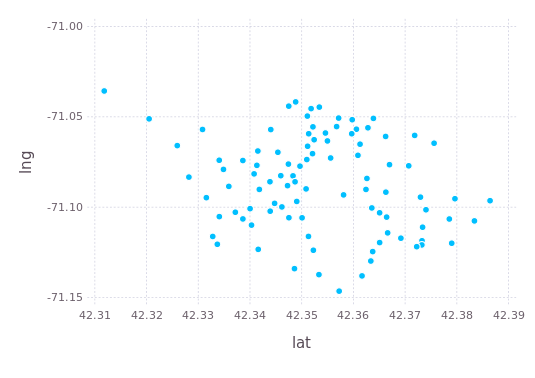

In [29]:
plot(stations,x=:lat, y=:lng, Geom.point)

Podemos poner etiquetas (util solo si hacemos zoom):

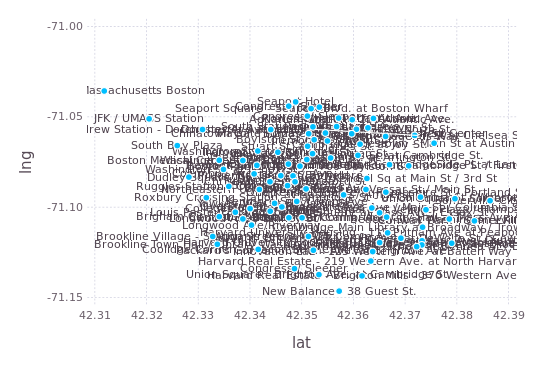


(process:84): Pango-WARNING **: pango_layout_set_markup_with_accel: Error on line 1: Entity did not end with a semicolon; most likely you used an ampersand character without intending to start an entity - escape ampersand as &amp;

(process:84): Pango-WARNING **: pango_layout_set_markup_with_accel: Error on line 1: Entity did not end with a semicolon; most likely you used an ampersand character without intending to start an entity - escape ampersand as &amp;


In [33]:
plot(stations,x=:lat, y=:lng, label=:name, Geom.point, Geom.label(hide_overlaps=false))

## Ejercicio 3:
Plotee las estaciones, pero donde el tamaño represente el número de viajes que sales desde cada estación.

In [38]:
tmp=by(trips,:start_station,nrow)

,start_station,x1
1,36,195
2,50,72
3,42,135
4,49,89
5,64,69
6,43,113
7,14,70
8,48,104
9,57,75
10,32,89


In [40]:
union=join(stations,tmp, on=(:id, :start_station))

,id,name,lat,lng,x1
1,3,Colleges of the Fenway,42.34,-71.1008,44
2,4,Tremont St. at Berkeley St.,42.3454,-71.0696,73
3,5,Northeastern U / North Parking Lot,42.3418,-71.0902,54
4,6,Cambridge St. at Joy St.,42.3613,-71.0651,86
5,7,Fan Pier,42.3534,-71.0446,48
6,8,Union Square - Brighton Ave. at Cambridge St.,42.3533,-71.1373,29
7,9,Agganis Arena - 925 Comm Ave.,42.3513,-71.1162,66
8,10,B.U. Central - 725 Comm. Ave.,42.3501,-71.1059,68
9,11,Longwood Ave / Binney St,42.3386,-71.1065,47
10,12,Ruggles Station / Columbus Ave.,42.3359,-71.0885,47


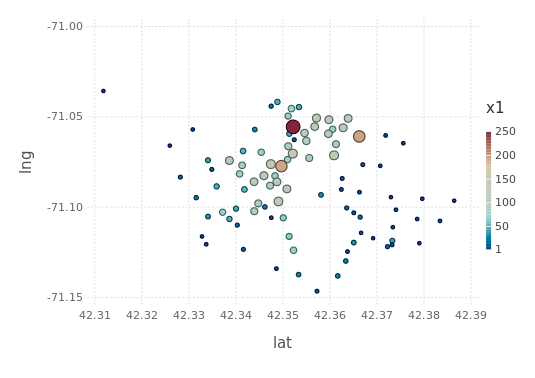

In [43]:
plot(union,x=:lat, y=:lng, size=:x1, color=:x1, Geom.point)

Analicemos ahora los datos. Veamos a que hora se realizan los viajes. Para esto, usamos la geometría `Histogram`, que solo tiene un aesthetic: `x`.

In [45]:
trips[:start_hour] = map(x -> Dates.hour(x), trips[:start_date]);

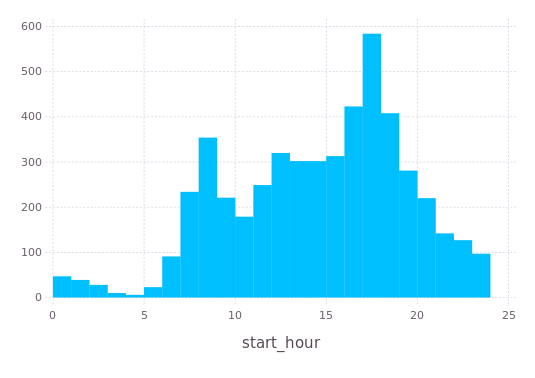

In [46]:
plot(trips, x=:start_hour, Geom.histogram(bincount=24))

Tambien, podemos agregar aesthetics, por ejemplo: 

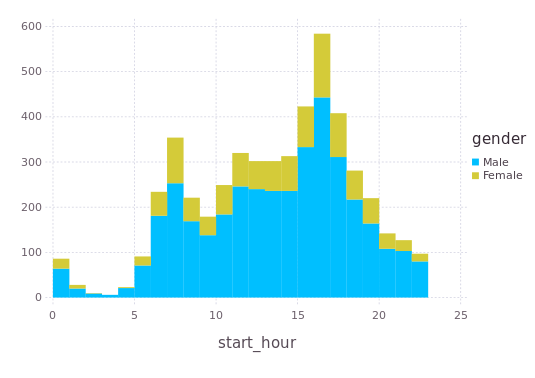

In [47]:
plot(trips, x=:start_hour, color=:gender, Geom.histogram(bincount=24))

aquí están todos los datos agregados. Supongamos que queremos este gráfico pero para cada dia de la semana. 

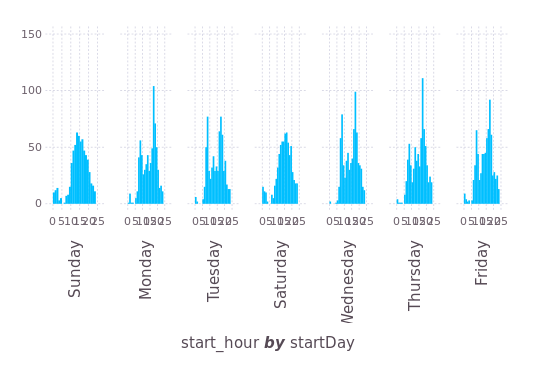

In [48]:
trips[:startDay] = map(x -> Dates.dayname(x),trips[:start_date]);
plot(trips, x=:start_hour, xgroup=:startDay, Geom.subplot_grid(Geom.histogram(bincount=24)))

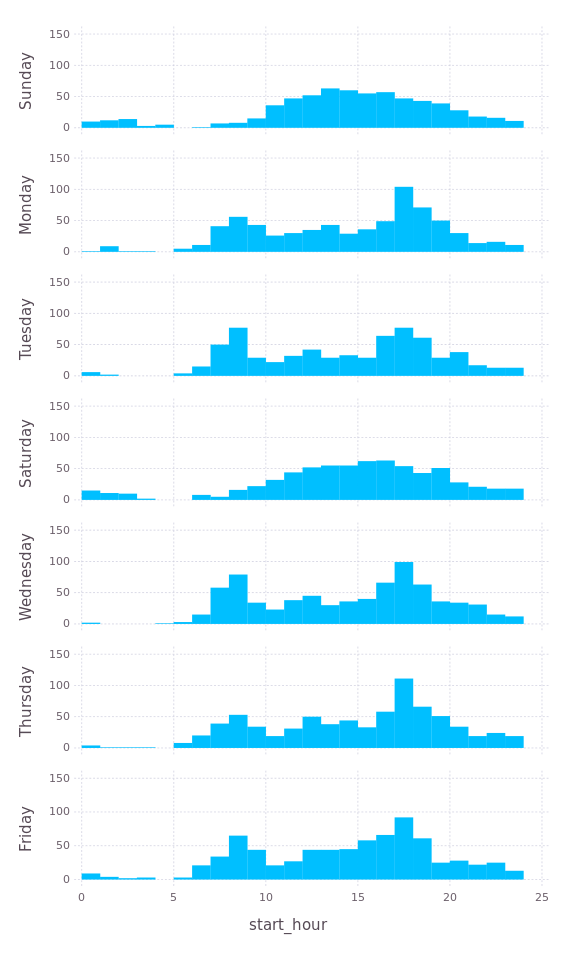

In [50]:
set_default_plot_size(6inch, 10inch)
plot(trips, x=:start_hour, ygroup=:startDay, Geom.subplot_grid(Geom.histogram(bincount=24)))
#plot(trips, x=:start_hour, ygroup=:startDay, xgroup=:subscription_type, Geom.subplot_grid(Geom.histogram(bincount=24)))



In [51]:
set_default_plot_size(6inch, 4inch)

## Ejercicio 4
Haga un histograma con la duración del viaje, con bins de 10 minutos (`bincount=24`), y separelo para cada tipo de subscripción.

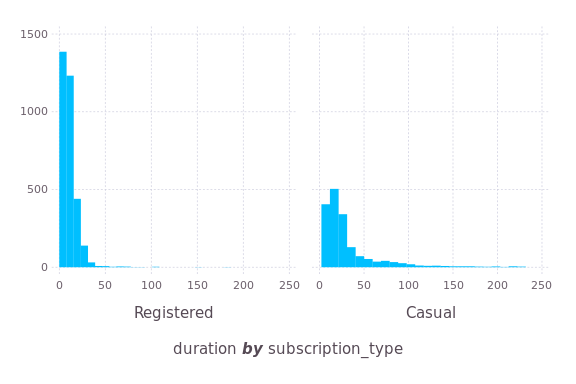

In [54]:
plot(trips, x=:duration, xgroup=:subscription_type, Geom.subplot_grid(Geom.histogram(bincount=24)))

Histogramas son utiles, pero solo permiten explorar en una dimensión. Si queremos ver el dia y la hora simulateamente, podemos hacer histogramas de dos dimensiones.

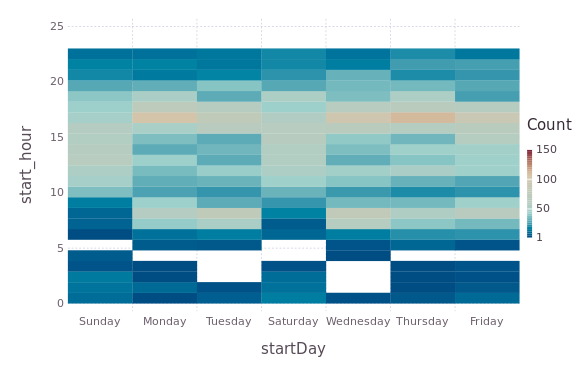

In [55]:
plot(trips, x=:startDay, y=:start_hour, Geom.histogram2d)

y muchas opciones más! Como capas (`layers`), otras geometrias (`density`, `boxplot`), etc. 

##  Gadfly.Stats
Gadfly permite hacer algunas evaluaciones basadas en estadísticas. 

### Boxplot
Permite estudiar distintos parametros estadísticos de un conjunto de datos. La caja representa los datos en entre el primer y tercer cuantíl. Los puntos son outliers.


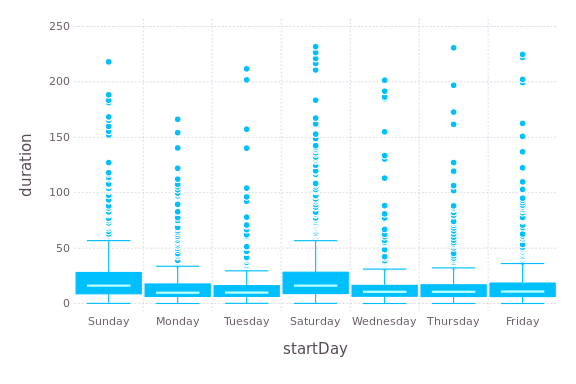

In [56]:
plot(trips, x=:startDay, y=:duration, Geom.boxplot)

In [57]:
dataTrips[:day] = map(x -> Dates.Date(x),dataTrips[:start_date]);

In [62]:
dayTrips = by(dataTrips, :day, x->DataFrame(numTrips=nrow(x)))
dayTrips[:start_day] = map(x -> Dates.dayname(x),dayTrips[:day]);
dayTrips[:start_month] = map(x -> Dates.monthname(x),dayTrips[:day]);

In [63]:
dayTrips

,day,numTrips,start_day,start_month
1,2011-07-28,418,Thursday,July
2,2011-07-29,525,Friday,July
3,2011-07-30,764,Saturday,July
4,2011-07-31,968,Sunday,July
5,2011-08-01,776,Monday,August
6,2011-08-02,644,Tuesday,August
7,2011-08-03,884,Wednesday,August
8,2011-08-04,1141,Thursday,August
9,2011-08-05,1564,Friday,August
10,2011-08-06,1549,Saturday,August


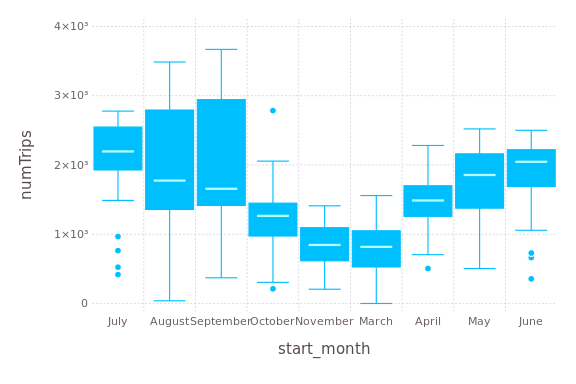

In [64]:
plot(dayTrips, x=:start_month, y=:numTrips, Geom.boxplot)

Otra alternativa similar al boxplot es el `Geom.beeswarm`, que ayuda a recalcar los puntos únicos.

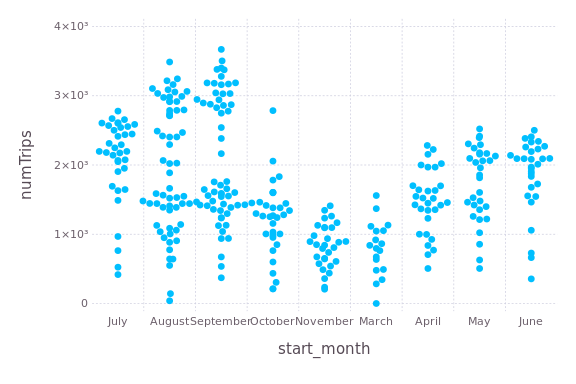

In [65]:
plot(dayTrips, x=:start_month, y=:numTrips, Geom.beeswarm)

### Density
Calcula una distribución óde probabilidad de un conjunto de datos, con otros.

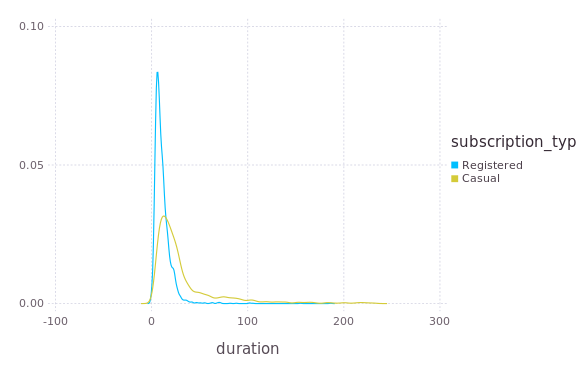

In [68]:
plot(trips, x=:duration, color=:subscription_type, Geom.density)

### QQ-Plot
Calcula los cuantiles de un conjunto de datos, y lo compara con otro conjunto (o una distribución de datos).  Por ejemplo, las duraciones de los viajes de usuarios registrados parecen seguir una distribución exponencial. Verifiquemoslo (graficamente).

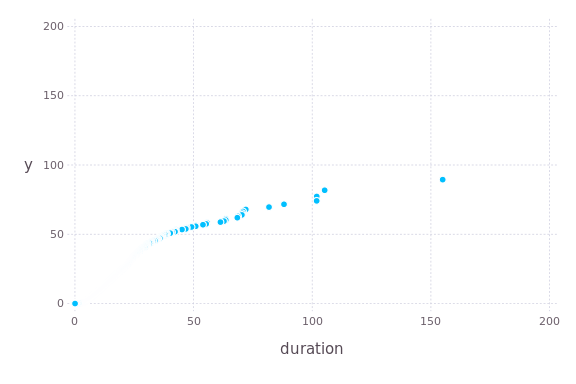

In [70]:
tripsReg = trips[trips[:subscription_type].=="Registered",:];
plot(tripsReg, x=:duration, y=Exponential(mean(tripsReg[:duration])), Stat.qq, Geom.point, Coord.cartesian(xmin=0, xmax=200, ymin=0, ymax=200))

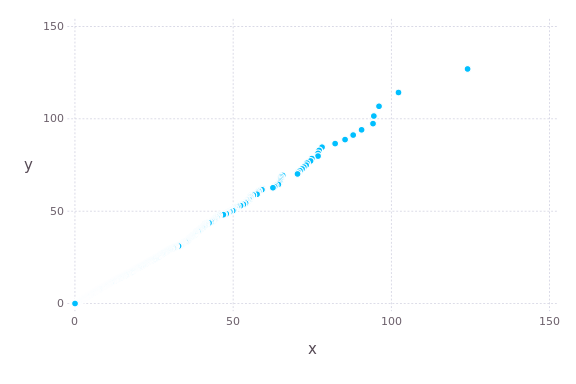

In [71]:
plot(trips, x=rand(Exponential(mean(trips[:duration])), 1000) , y=Exponential(mean(trips[:duration])), Stat.qq, Geom.point)